In [20]:
import json
import requests
from PIL import Image, ImageDraw
from io import BytesIO
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input
from tensorflow.keras.preprocessing.image import img_to_array
from sklearn.metrics.pairwise import cosine_similarity
import os
import matplotlib.pyplot as plt
import numpy as np
import torch

In [23]:
import open_clip

C:\Users\bbbah\anaconda3\Lib\site-packages\transformers\utils\generic.py:260: UserWarning: torch.utils._pytree._register_pytree_node is deprecated. Please use torch.utils._pytree.register_pytree_node instead.
  torch.utils._pytree._register_pytree_node(


In [190]:
!pip install tensorflow

  Obtaining dependency information for tensorflow from https://files.pythonhosted.org/packages/e4/14/d795bb156f8cc10eb1dcfe1332b7dbb8405b634688980aa9be8f885cc888/tensorflow-2.16.1-cp311-cp311-win_amd64.whl.metadata
  Obtaining dependency information for tensorflow-intel==2.16.1 from https://files.pythonhosted.org/packages/e0/36/6278e4e7e69a90c00e0f82944d8f2713dd85a69d1add455d9e50446837ab/tensorflow_intel-2.16.1-cp311-cp311-win_amd64.whl.metadata
  Obtaining dependency information for absl-py>=1.0.0 from https://files.pythonhosted.org/packages/a2/ad/e0d3c824784ff121c03cc031f944bc7e139a8f1870ffd2845cc2dd76f6c4/absl_py-2.1.0-py3-none-any.whl.metadata
  Obtaining dependency information for astunparse>=1.6.0 from https://files.pythonhosted.org/packages/2b/03/13dde6512ad7b4557eb792fbcf0c653af6076b81e5941d36ec61f7ce6028/astunparse-1.6.3-py2.py3-none-any.whl.metadata
  Obtaining dependency information for flatbuffers>=23.5.26 from https://files.pythonhosted.org/packages/41/f0/7e988a019bc54b2db

In [91]:
!pip install git+https://github.com/openai/CLIP.git

  Obtaining dependency information for open_clip_torch from https://files.pythonhosted.org/packages/d9/d2/6ae2ee32d0d2ea9982774920e0ef96d439ee332f459f6d8a941149b1b4ad/open_clip_torch-2.24.0-py3-none-any.whl.metadata
  Obtaining dependency information for torch>=1.9.0 from https://files.pythonhosted.org/packages/5c/01/5ab75f138bf32d7a69df61e4997e24eccad87cc009f5fb7e2a31af8a4036/torch-2.2.2-cp311-cp311-win_amd64.whl.metadata
  Using cached torch-2.2.2-cp311-cp311-win_amd64.whl.metadata (26 kB)
  Obtaining dependency information for torchvision from https://files.pythonhosted.org/packages/c6/75/d869f600fc33df8b8ca99943e165a4ca23b73c68dc1942098fde0a6b46f3/torchvision-0.17.2-cp311-cp311-win_amd64.whl.metadata
  Using cached torchvision-0.17.2-cp311-cp311-win_amd64.whl.metadata (6.6 kB)
  Obtaining dependency information for ftfy from https://files.pythonhosted.org/packages/f4/f0/21efef51304172736b823689aaf82f33dbc64f54e9b046b75f5212d5cee7/ftfy-6.2.0-py3-none-any.whl.metadata
  Using cached 

  Cloning https://github.com/openai/CLIP.git to c:\users\bbbah\appdata\local\temp\pip-req-build-v3c4irpl
  Resolved https://github.com/openai/CLIP.git to commit a1d071733d7111c9c014f024669f959182114e33
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'


  Running command git clone --filter=blob:none --quiet https://github.com/openai/CLIP.git 'C:\Users\bbbah\AppData\Local\Temp\pip-req-build-v3c4irpl'


In [92]:
!pip install open_clip_torch

In [93]:
!pip install sentence_transformers

  Obtaining dependency information for sentence_transformers from https://files.pythonhosted.org/packages/ba/20/7ef81df2e07322d95332d07c1c38c597f543c1f666d689a3153ba6fa09e3/sentence_transformers-2.6.1-py3-none-any.whl.metadata
  Using cached sentence_transformers-2.6.1-py3-none-any.whl.metadata (11 kB)
Using cached sentence_transformers-2.6.1-py3-none-any.whl (163 kB)


In [2]:
file_path = 'C:/Users/bbbah/OneDrive/Masaüstü/TYCase/Version2_CaseStudy_DS_Image/export.json'

with open(file_path, 'r') as file:
    json_data = json.load(file)

In [3]:
parsed_data = []
for item in json_data:
    image_url = item.get("asset", "")
    for task in item.get("tasks", []):
        for obj in task.get("objects", []):
            bounding_box = obj.get("bounding-box", {})
            title = obj.get("title", "")
            parsed_data.append({
                "image_url": image_url,
                "title": title,
                "bounding_box": bounding_box
            })

In [4]:
parsed_data

[{'image_url': 'https://cdn.dsmcdn.com/mnresize/1200/1800/assets/dev/product/media/images/20200330/11/695981/66988230/1/1_org_zoom.jpg',
  'title': 'Ãœst Giyim',
  'bounding_box': {'x': 456.4593301435406,
   'y': 45.859872611464965,
   'height': 1484.7133757961785,
   'width': 734.9282296650707}},
 {'image_url': 'https://cdn.dsmcdn.com/mnresize/1200/1800/assets/dev/product/media/images/20200330/11/695981/66988230/1/1_org_zoom.jpg',
  'title': 'Aksesuar',
  'bounding_box': {'x': 68.8995215311008,
   'y': 8.5987261146499,
   'height': 1788.535031847131,
   'width': 1111.004784688991}},
 {'image_url': 'https://cdn.dsmcdn.com/mnresize/1200/1800/assets/product/media/images/20200313/9/4396218/56802179/1/1_org_zoom.jpeg',
  'title': 'Tek parÃ§a',
  'bounding_box': {'x': 321.0964533192285,
   'y': 358.2883023936305,
   'height': 1142.1851145389373,
   'width': 585.5721967099919}},
 {'image_url': 'https://cdn.dsmcdn.com/mnresize/1200/1800/assets/product/media/images/20200313/9/4396218/56802179/

In [5]:
unique_titles = {item['title'] for item in parsed_data}
unique_titles

{'Aksesuar',
 'Aksesuar giyim',
 'Alt Giyim',
 'AyakkabÄ±',
 'Bebek giyim',
 'DÄ±ÅŸ giyim',
 'Tek parÃ§a',
 'Ãœst Giyim',
 'Ä°Ã§ Giyim'}

In [6]:
len(parsed_data)

41734

In [7]:
aksesuar_data = []
aksesuar_giyim_data = []
alt_giyim_data = []
ayakkabi_data = []  # 'AyakkabÄ±' is assumed to be 'Ayakkabi'
bebek_giyim_data = []
dis_giyim_data = []  # 'DÄ±ÅŸ giyim' is assumed to be 'Dis giyim'
tek_parca_data = []  # 'Tek parÃ§a' is assumed to be 'Tek parca'
ust_giyim_data = []  # 'Ãœst Giyim' is assumed to be 'Ust Giyim'
ic_giyim_data = []   # 'Ä°Ã§ Giyim' is assumed to be 'Ic Giyim'

In [8]:
for index, item in enumerate(parsed_data):
    title = item['title']
    if title == 'Aksesuar':
        aksesuar_data.append(index-5)
    elif title == 'Aksesuar giyim':
        aksesuar_giyim_data.append(index-5)
    elif title == 'Alt Giyim':
        alt_giyim_data.append(index-5)
    elif title == 'AyakkabÄ±':
        ayakkabi_data.append(index-5)
    elif title == 'Bebek giyim':
        bebek_giyim_data.append(index-5)
    elif title == 'DÄ±ÅŸ giyim':
        dis_giyim_data.append(index-5)
    elif title == 'Tek parÃ§a':
        tek_parca_data.append(index-5)
    elif title == 'Ãœst Giyim':
        ust_giyim_data.append(index-5)
    elif title == 'Ä°Ã§ Giyim':
        ic_giyim_data.append(index-5)

In [9]:
def crop_image_from_url(image_url, bounding_box, timeout=10):
    try:
        response = requests.get(image_url, timeout=timeout, verify=False)
        if response.status_code == 200:
            img = Image.open(BytesIO(response.content))

            x = bounding_box['x']
            y = bounding_box['y']
            width = bounding_box['width']
            height = bounding_box['height']

            left = min(x, x + width)
            top = min(y, y + height)
            right = max(x, x + width)
            bottom = max(y, y + height)

            cropped_img = img.crop((left, top, right, bottom))

            return cropped_img
        else:
            return None
    except requests.exceptions.Timeout:
        print(f"Request timed out for {image_url}")
        return None
    except Exception as e:
        print(f"An error occurred for {image_url} and bounding box {bounding_box}: {e}")
        return None
    

In [10]:
cropped_images_dir = 'cropped_images'
os.makedirs(cropped_images_dir, exist_ok=True)

In [11]:
cropped_images = []

In [20]:
counter = 0
for item in parsed_data:
    cropped_image = crop_image_from_url(item['image_url'], item['bounding_box'])
    if cropped_image:
        
        filename = f"cropped_image_{counter}.jpg"
        filepath = os.path.join(cropped_images_dir, filename)
        
        cropped_image.save(filepath)
        
        cropped_images.append(filepath)

    counter += 1
    if counter % 500 == 0:
        print(f"{counter}. image is cropped and processed.")


500. image is cropped and processed.
1000. image is cropped and processed.
1500. image is cropped and processed.
2000. image is cropped and processed.
Request timed out for https://cdn.dsmcdn.com/mnresize/1200/1800/ty11/product/media/images/20200921/13/11267334/87666859/1/1_org_zoom.jpg
2500. image is cropped and processed.
3000. image is cropped and processed.
3500. image is cropped and processed.
4000. image is cropped and processed.
An error occurred for https://cdn.dsmcdn.com/mnresize/1200/1800/ty120/product/media/images/20210529/23/93643788/180389161/0/0_org_zoom.jpg and bounding box {'x': 492.4356025018865, 'y': 367.6508741842678, 'height': 250.18667483935903, 'width': 248.62318553890205}: HTTPSConnectionPool(host='cdn.dsmcdn.com', port=443): Max retries exceeded with url: /mnresize/1200/1800/ty120/product/media/images/20210529/23/93643788/180389161/0/0_org_zoom.jpg (Caused by SSLError(SSLEOFError(8, '[SSL: UNEXPECTED_EOF_WHILE_READING] EOF occurred in violation of protocol (_ssl

An error occurred for https://cdn.dsmcdn.com/mnresize/1200/1800/ty162/product/media/images/20210825/15/122438010/233043269/1/1_org_zoom.jpg and bounding box {'x': 570.7823117097882, 'y': 1259.7617367880666, 'height': -403.9820925165816, 'width': 337.44455598391943}: HTTPSConnectionPool(host='cdn.dsmcdn.com', port=443): Max retries exceeded with url: /mnresize/1200/1800/ty162/product/media/images/20210825/15/122438010/233043269/1/1_org_zoom.jpg (Caused by NewConnectionError('<urllib3.connection.HTTPSConnection object at 0x00000221C6435810>: Failed to establish a new connection: [Errno 11002] getaddrinfo failed'))
An error occurred for https://cdn.dsmcdn.com/mnresize/1200/1800/ty162/product/media/images/20210825/15/122456555/233066158/1/1_org_zoom.jpg and bounding box {'x': 458.10460387906636, 'y': 303.08054838062327, 'height': 304.1200144238372, 'width': 289.02403150785767}: HTTPSConnectionPool(host='cdn.dsmcdn.com', port=443): Max retries exceeded with url: /mnresize/1200/1800/ty162/pr

An error occurred for https://cdn.dsmcdn.com/mnresize/1200/1800/ty165/product/media/images/20210826/14/122794927/233502424/1/1_org_zoom.jpg and bounding box {'x': 213.5090124845481, 'y': 1252.2581403028164, 'height': -814.3497240286277, 'width': 936.2751955348328}: HTTPSConnectionPool(host='cdn.dsmcdn.com', port=443): Max retries exceeded with url: /mnresize/1200/1800/ty165/product/media/images/20210826/14/122794927/233502424/1/1_org_zoom.jpg (Caused by NewConnectionError('<urllib3.connection.HTTPSConnection object at 0x00000221C2AE8F10>: Failed to establish a new connection: [Errno 11002] getaddrinfo failed'))
An error occurred for https://cdn.dsmcdn.com/mnresize/1200/1800/ty165/product/media/images/20210826/14/122794927/233502424/1/1_org_zoom.jpg and bounding box {'x': 48.87595491284983, 'y': 1597.1538677428714, 'height': -614.2554102775649, 'width': 998.4917733022438}: HTTPSConnectionPool(host='cdn.dsmcdn.com', port=443): Max retries exceeded with url: /mnresize/1200/1800/ty165/prod

An error occurred for https://cdn.dsmcdn.com/mnresize/1200/1800/ty167/product/media/images/20210827/10/123025023/233796790/1/1_org_zoom.jpg and bounding box {'x': 582.1752203474583, 'y': 1550.9194381369223, 'height': 184.84646418509016, 'width': 91.56443498413344}: HTTPSConnectionPool(host='cdn.dsmcdn.com', port=443): Max retries exceeded with url: /mnresize/1200/1800/ty167/product/media/images/20210827/10/123025023/233796790/1/1_org_zoom.jpg (Caused by NewConnectionError('<urllib3.connection.HTTPSConnection object at 0x00000220BB910090>: Failed to establish a new connection: [Errno 11002] getaddrinfo failed'))
An error occurred for https://cdn.dsmcdn.com/mnresize/1200/1800/ty167/product/media/images/20210827/10/123025023/233796790/1/1_org_zoom.jpg and bounding box {'x': 373.5157739363313, 'y': 428.38311005267315, 'height': 1057.89083913353, 'width': 618.5235242309217}: HTTPSConnectionPool(host='cdn.dsmcdn.com', port=443): Max retries exceeded with url: /mnresize/1200/1800/ty167/produc

An error occurred for https://cdn.dsmcdn.com/mnresize/1200/1800/ty17/product/media/images/20201022/9/18920151/82084466/1/1_org_zoom.jpg and bounding box {'x': 345.0113221320363, 'y': 1358.353634466197, 'height': 47.86877193590137, 'width': -73.21106296078962}: HTTPSConnectionPool(host='cdn.dsmcdn.com', port=443): Max retries exceeded with url: /mnresize/1200/1800/ty17/product/media/images/20201022/9/18920151/82084466/1/1_org_zoom.jpg (Caused by NewConnectionError('<urllib3.connection.HTTPSConnection object at 0x00000221C6CC1590>: Failed to establish a new connection: [Errno 11002] getaddrinfo failed'))
An error occurred for https://cdn.dsmcdn.com/mnresize/1200/1800/ty17/product/media/images/20201022/9/18920151/82084466/1/1_org_zoom.jpg and bounding box {'x': 952.7349039943381, 'y': 455.28258291292616, 'height': 896.3404526706066, 'width': -693.7365629892095}: HTTPSConnectionPool(host='cdn.dsmcdn.com', port=443): Max retries exceeded with url: /mnresize/1200/1800/ty17/product/media/imag

An error occurred for https://cdn.dsmcdn.com/mnresize/1200/1800/ty171/product/media/images/20210908/20/127745615/239167662/1/1_org_zoom.jpg and bounding box {'x': 968.6841754822066, 'y': 1728.3439490445858, 'height': -383.08153919039876, 'width': -708.2130570603825}: HTTPSConnectionPool(host='cdn.dsmcdn.com', port=443): Max retries exceeded with url: /mnresize/1200/1800/ty171/product/media/images/20210908/20/127745615/239167662/1/1_org_zoom.jpg (Caused by NewConnectionError('<urllib3.connection.HTTPSConnection object at 0x00000221C6CC19D0>: Failed to establish a new connection: [Errno 11002] getaddrinfo failed'))
An error occurred for https://cdn.dsmcdn.com/mnresize/1200/1800/ty171/product/media/images/20210908/20/127745615/239167662/1/1_org_zoom.jpg and bounding box {'x': 264.1029407085347, 'y': 1174.7802284571242, 'height': 203.71637626993734, 'width': 707.0267705326435}: HTTPSConnectionPool(host='cdn.dsmcdn.com', port=443): Max retries exceeded with url: /mnresize/1200/1800/ty171/pr

An error occurred for https://cdn.dsmcdn.com/mnresize/1200/1800/ty173/product/media/images/20210906/19/126834747/238117219/1/1_org_zoom.jpg and bounding box {'x': 409.0672570871897, 'y': 717.4966941520765, 'height': 276.60505411434195, 'width': 343.3494318343664}: HTTPSConnectionPool(host='cdn.dsmcdn.com', port=443): Max retries exceeded with url: /mnresize/1200/1800/ty173/product/media/images/20210906/19/126834747/238117219/1/1_org_zoom.jpg (Caused by NewConnectionError('<urllib3.connection.HTTPSConnection object at 0x00000220B0AD29D0>: Failed to establish a new connection: [Errno 11002] getaddrinfo failed'))
An error occurred for https://cdn.dsmcdn.com/mnresize/1200/1800/ty173/product/media/images/20210907/15/127222211/238574235/1/1_org_zoom.jpg and bounding box {'x': 299.4818945491907, 'y': 298.58766489831356, 'height': 1205.6850857334111, 'width': 603.8594183788576}: HTTPSConnectionPool(host='cdn.dsmcdn.com', port=443): Max retries exceeded with url: /mnresize/1200/1800/ty173/produ

An error occurred for https://cdn.dsmcdn.com/mnresize/1200/1800/ty174/product/media/images/20210915/19/130391954/241738668/1/1_org_zoom.jpg and bounding box {'x': 316.23683075929875, 'y': 431.84581472948724, 'height': 849.303317194374, 'width': 584.0451462330568}: HTTPSConnectionPool(host='cdn.dsmcdn.com', port=443): Max retries exceeded with url: /mnresize/1200/1800/ty174/product/media/images/20210915/19/130391954/241738668/1/1_org_zoom.jpg (Caused by NewConnectionError('<urllib3.connection.HTTPSConnection object at 0x00000221C2AE87D0>: Failed to establish a new connection: [Errno 11002] getaddrinfo failed'))
An error occurred for https://cdn.dsmcdn.com/mnresize/1200/1800/ty174/product/media/images/20210915/19/130391954/241738668/1/1_org_zoom.jpg and bounding box {'x': 622.1997367311368, 'y': 247.49905856549245, 'height': 249.51199745972363, 'width': 196.10996684321785}: HTTPSConnectionPool(host='cdn.dsmcdn.com', port=443): Max retries exceeded with url: /mnresize/1200/1800/ty174/prod

An error occurred for https://cdn.dsmcdn.com/mnresize/1200/1800/ty175/product/media/images/20210916/16/131370869/243544963/1/1_org_zoom.jpg and bounding box {'x': 49.48239663053138, 'y': 1633.4783026458347, 'height': -1455.101633784951, 'width': 1104.9010160720723}: HTTPSConnectionPool(host='cdn.dsmcdn.com', port=443): Max retries exceeded with url: /mnresize/1200/1800/ty175/product/media/images/20210916/16/131370869/243544963/1/1_org_zoom.jpg (Caused by NewConnectionError('<urllib3.connection.HTTPSConnection object at 0x00000221C2AE8850>: Failed to establish a new connection: [Errno 11002] getaddrinfo failed'))
An error occurred for https://cdn.dsmcdn.com/mnresize/1200/1800/ty175/product/media/images/20210916/16/131380545/243556407/1/1_org_zoom.jpg and bounding box {'x': 261.24401913875727, 'y': 31.52866242038209, 'height': 942.993630573248, 'width': 645.9330143540653}: HTTPSConnectionPool(host='cdn.dsmcdn.com', port=443): Max retries exceeded with url: /mnresize/1200/1800/ty175/produ

An error occurred for https://cdn.dsmcdn.com/mnresize/1200/1800/ty178/product/media/images/20210918/15/132483000/245157394/0/0_org_zoom.jpg and bounding box {'x': 560.242171460569, 'y': 388.68350659183653, 'height': 59.54906515605131, 'width': 101.69148049725686}: HTTPSConnectionPool(host='cdn.dsmcdn.com', port=443): Max retries exceeded with url: /mnresize/1200/1800/ty178/product/media/images/20210918/15/132483000/245157394/0/0_org_zoom.jpg (Caused by NewConnectionError('<urllib3.connection.HTTPSConnection object at 0x00000221C643C450>: Failed to establish a new connection: [Errno 11002] getaddrinfo failed'))
An error occurred for https://cdn.dsmcdn.com/mnresize/1200/1800/ty178/product/media/images/20210918/15/132483000/245157394/0/0_org_zoom.jpg and bounding box {'x': 433.2747246999052, 'y': 900.3555051912194, 'height': -407.053907669147, 'width': 340.6106535919527}: HTTPSConnectionPool(host='cdn.dsmcdn.com', port=443): Max retries exceeded with url: /mnresize/1200/1800/ty178/product

An error occurred for https://cdn.dsmcdn.com/mnresize/1200/1800/ty18/product/media/images/20201027/14/19923672/98044794/1/1_org_zoom.jpg and bounding box {'x': 252.7715962427522, 'y': 298.1946175367091, 'height': 468.6645051861149, 'width': 837.1717830136005}: HTTPSConnectionPool(host='cdn.dsmcdn.com', port=443): Max retries exceeded with url: /mnresize/1200/1800/ty18/product/media/images/20201027/14/19923672/98044794/1/1_org_zoom.jpg (Caused by NewConnectionError('<urllib3.connection.HTTPSConnection object at 0x00000221C6247310>: Failed to establish a new connection: [Errno 11002] getaddrinfo failed'))
An error occurred for https://cdn.dsmcdn.com/mnresize/1200/1800/ty18/product/media/images/20201027/14/19923672/98044794/1/1_org_zoom.jpg and bounding box {'x': 584.0242926816353, 'y': 23.901319364419447, 'height': 304.9413343159861, 'width': 221.80426661034988}: HTTPSConnectionPool(host='cdn.dsmcdn.com', port=443): Max retries exceeded with url: /mnresize/1200/1800/ty18/product/media/im

An error occurred for https://cdn.dsmcdn.com/mnresize/1200/1800/ty180/product/media/images/20210922/12/135220643/248304041/1/1_org_zoom.jpg and bounding box {'x': 254.81076093055717, 'y': 999.4354435191163, 'height': -535.8398259868052, 'width': 789.3835485268988}: HTTPSConnectionPool(host='cdn.dsmcdn.com', port=443): Max retries exceeded with url: /mnresize/1200/1800/ty180/product/media/images/20210922/12/135220643/248304041/1/1_org_zoom.jpg (Caused by NewConnectionError('<urllib3.connection.HTTPSConnection object at 0x00000221C6CAEFD0>: Failed to establish a new connection: [Errno 11002] getaddrinfo failed'))
An error occurred for https://cdn.dsmcdn.com/mnresize/1200/1800/ty180/product/media/images/20210922/12/135220643/248304041/1/1_org_zoom.jpg and bounding box {'x': 234.59317626155664, 'y': 1638.4478890641026, 'height': -708.4586655388485, 'width': 623.0640942462167}: HTTPSConnectionPool(host='cdn.dsmcdn.com', port=443): Max retries exceeded with url: /mnresize/1200/1800/ty180/pro

An error occurred for https://cdn.dsmcdn.com/mnresize/1200/1800/ty182/product/media/images/20210920/15/134019154/246839048/1/1_org_zoom.jpg and bounding box {'x': 155.59118409369572, 'y': 50.763278412381176, 'height': 956.1318294276124, 'width': 692.3599552805919}: HTTPSConnectionPool(host='cdn.dsmcdn.com', port=443): Max retries exceeded with url: /mnresize/1200/1800/ty182/product/media/images/20210920/15/134019154/246839048/1/1_org_zoom.jpg (Caused by NewConnectionError('<urllib3.connection.HTTPSConnection object at 0x00000221C6CAF0D0>: Failed to establish a new connection: [Errno 11002] getaddrinfo failed'))
An error occurred for https://cdn.dsmcdn.com/mnresize/1200/1800/ty182/product/media/images/20210920/15/134019154/246839048/1/1_org_zoom.jpg and bounding box {'x': 235.39591414161498, 'y': 1594.7869759339987, 'height': 195.96395603133476, 'width': 256.66926691087383}: HTTPSConnectionPool(host='cdn.dsmcdn.com', port=443): Max retries exceeded with url: /mnresize/1200/1800/ty182/pr

An error occurred for https://cdn.dsmcdn.com/mnresize/1200/1800/ty183/product/media/images/20210928/17/137166243/250753067/1/1_org_zoom.jpg and bounding box {'x': 29.073129172216344, 'y': 567.7904677859096, 'height': 495.5686783080423, 'width': 892.9093726112962}: HTTPSConnectionPool(host='cdn.dsmcdn.com', port=443): Max retries exceeded with url: /mnresize/1200/1800/ty183/product/media/images/20210928/17/137166243/250753067/1/1_org_zoom.jpg (Caused by NewConnectionError('<urllib3.connection.HTTPSConnection object at 0x00000221C2AEB450>: Failed to establish a new connection: [Errno 11002] getaddrinfo failed'))
An error occurred for https://cdn.dsmcdn.com/mnresize/1200/1800/ty183/product/media/images/20210928/17/137166243/250753067/1/1_org_zoom.jpg and bounding box {'x': 464.73440547926947, 'y': 1053.5652986965754, 'height': 94.02093501496655, 'width': 68.6853363547136}: HTTPSConnectionPool(host='cdn.dsmcdn.com', port=443): Max retries exceeded with url: /mnresize/1200/1800/ty183/produc

An error occurred for https://cdn.dsmcdn.com/mnresize/1200/1800/ty185/product/media/images/20210925/16/136331545/249551756/1/1_org_zoom.jpg and bounding box {'x': 709.1242777132713, 'y': 102.68338483910645, 'height': 651.1402293678954, 'width': 226.51209865197953}: HTTPSConnectionPool(host='cdn.dsmcdn.com', port=443): Max retries exceeded with url: /mnresize/1200/1800/ty185/product/media/images/20210925/16/136331545/249551756/1/1_org_zoom.jpg (Caused by NewConnectionError('<urllib3.connection.HTTPSConnection object at 0x00000221C2AE9AD0>: Failed to establish a new connection: [Errno 11002] getaddrinfo failed'))
An error occurred for https://cdn.dsmcdn.com/mnresize/1200/1800/ty185/product/media/images/20210925/16/136331545/249551756/1/1_org_zoom.jpg and bounding box {'x': 740.2263077879485, 'y': 101.02836459865553, 'height': 42.033120968356414, 'width': 156.06792356107428}: HTTPSConnectionPool(host='cdn.dsmcdn.com', port=443): Max retries exceeded with url: /mnresize/1200/1800/ty185/pro

An error occurred for https://cdn.dsmcdn.com/mnresize/1200/1800/ty186/product/media/images/20211005/14/140104695/171265749/1/1_org_zoom.jpg and bounding box {'x': 193.05983837432086, 'y': 369.2621827020653, 'height': 928.2962216814474, 'width': 810.3896517106109}: HTTPSConnectionPool(host='cdn.dsmcdn.com', port=443): Max retries exceeded with url: /mnresize/1200/1800/ty186/product/media/images/20211005/14/140104695/171265749/1/1_org_zoom.jpg (Caused by NewConnectionError('<urllib3.connection.HTTPSConnection object at 0x00000221C2AE8650>: Failed to establish a new connection: [Errno 11002] getaddrinfo failed'))
An error occurred for https://cdn.dsmcdn.com/mnresize/1200/1800/ty186/product/media/images/20211005/14/140133841/254189209/1/1_org_zoom.jpg and bounding box {'x': 321.56875307481454, 'y': 298.4283333734933, 'height': 526.5590627195301, 'width': 509.7206954291559}: HTTPSConnectionPool(host='cdn.dsmcdn.com', port=443): Max retries exceeded with url: /mnresize/1200/1800/ty186/produc

An error occurred for https://cdn.dsmcdn.com/mnresize/1200/1800/ty188/product/media/images/20211005/19/140651863/254888908/1/1_org_zoom.jpg and bounding box {'x': 327.7499999999995, 'y': 140.67495559502663, 'height': 1483.4813499111906, 'width': 355.2000000000006}: HTTPSConnectionPool(host='cdn.dsmcdn.com', port=443): Max retries exceeded with url: /mnresize/1200/1800/ty188/product/media/images/20211005/19/140651863/254888908/1/1_org_zoom.jpg (Caused by NewConnectionError('<urllib3.connection.HTTPSConnection object at 0x00000221C2AE81D0>: Failed to establish a new connection: [Errno 11002] getaddrinfo failed'))
An error occurred for https://cdn.dsmcdn.com/mnresize/1200/1800/ty188/product/media/images/20211005/19/140743889/254991467/1/1_org_zoom.jpg and bounding box {'x': 582.635125, 'y': 976.2221238484234, 'height': 578.4599365423392, 'width': 480.3999999999992}: HTTPSConnectionPool(host='cdn.dsmcdn.com', port=443): Max retries exceeded with url: /mnresize/1200/1800/ty188/product/media

An error occurred for https://cdn.dsmcdn.com/mnresize/1200/1800/ty19/product/media/images/20201105/9/22656896/101216078/0/0_org_zoom.jpg and bounding box {'x': 1.7891552986360695, 'y': 115.84942042508844, 'height': 1177.4317046375882, 'width': 1193.1608447013678}: HTTPSConnectionPool(host='cdn.dsmcdn.com', port=443): Max retries exceeded with url: /mnresize/1200/1800/ty19/product/media/images/20201105/9/22656896/101216078/0/0_org_zoom.jpg (Caused by NewConnectionError('<urllib3.connection.HTTPSConnection object at 0x00000221C643C450>: Failed to establish a new connection: [Errno 11002] getaddrinfo failed'))
An error occurred for https://cdn.dsmcdn.com/mnresize/1200/1800/ty19/product/media/images/20210318/11/73315666/154628247/1/1_org_zoom.jpg and bounding box {'x': 871.0346740975631, 'y': 351.4048740141504, 'height': 1099.3519052144236, 'width': -416.5077557046882}: HTTPSConnectionPool(host='cdn.dsmcdn.com', port=443): Max retries exceeded with url: /mnresize/1200/1800/ty19/product/med

An error occurred for https://cdn.dsmcdn.com/mnresize/1200/1800/ty191/product/media/images/20211007/19/142189437/254588220/1/1_org_zoom.jpg and bounding box {'x': 40.19138755980812, 'y': 639.171974522293, 'height': 472.92993630573244, 'width': 1113.8755980861242}: HTTPSConnectionPool(host='cdn.dsmcdn.com', port=443): Max retries exceeded with url: /mnresize/1200/1800/ty191/product/media/images/20211007/19/142189437/254588220/1/1_org_zoom.jpg (Caused by NewConnectionError('<urllib3.connection.HTTPSConnection object at 0x00000221C2AE8950>: Failed to establish a new connection: [Errno 11002] getaddrinfo failed'))
An error occurred for https://cdn.dsmcdn.com/mnresize/1200/1800/ty191/product/media/images/20211007/4/141931110/256382670/0/0_org_zoom.jpg and bounding box {'x': 412.8937916666661, 'y': 0, 'height': 1142.0195381882784, 'width': 762.2346666666677}: HTTPSConnectionPool(host='cdn.dsmcdn.com', port=443): Max retries exceeded with url: /mnresize/1200/1800/ty191/product/media/images/20

An error occurred for https://cdn.dsmcdn.com/mnresize/1200/1800/ty193/product/media/images/20211011/13/145021273/260037011/1/1_org_zoom.jpg and bounding box {'x': 506.307255551905, 'y': 650.0310656836629, 'height': 595.3002771302955, 'width': 292.0095952476364}: HTTPSConnectionPool(host='cdn.dsmcdn.com', port=443): Max retries exceeded with url: /mnresize/1200/1800/ty193/product/media/images/20211011/13/145021273/260037011/1/1_org_zoom.jpg (Caused by NewConnectionError('<urllib3.connection.HTTPSConnection object at 0x00000221C2AEAB10>: Failed to establish a new connection: [Errno 11002] getaddrinfo failed'))
An error occurred for https://cdn.dsmcdn.com/mnresize/1200/1800/ty193/product/media/images/20211011/13/145021273/260037011/1/1_org_zoom.jpg and bounding box {'x': 792.2999358381642, 'y': 998.0458303206653, 'height': 11.360768514512566, 'width': 12.020630802580673}: HTTPSConnectionPool(host='cdn.dsmcdn.com', port=443): Max retries exceeded with url: /mnresize/1200/1800/ty193/product

12000. image is cropped and processed.
12500. image is cropped and processed.
13000. image is cropped and processed.
13500. image is cropped and processed.
14000. image is cropped and processed.


OSError: cannot write mode P as JPEG

In [12]:
url = parsed_data[14257]['image_url']

In [13]:
responses = requests.get(url, timeout=10)
print(responses.status_code == 200)

True


In [14]:
img1 = Image.open(BytesIO(responses.content))

In [15]:
cropped_images_dir = 'cropped_images'

In [16]:
def load_and_extract_features(directory):
    file_list = os.listdir(directory)
    all_features = []
    
    for i, filename in enumerate(file_list):
        filepath = os.path.join(directory, filename)
        with Image.open(filepath) as img:
            features = extract_features(img)
            all_features.append(features)
        img.close()
        if i % 500 == 0:
            print(f"{i}. image's features are encoded.")
        
    return all_features

In [21]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(device)

cpu


In [25]:
# Pre-trained CLIP model
model, _ ,preprocess = open_clip.create_model_and_transforms('ViT-B-16-plus-240', pretrained="laion400m_e32")
model.to(device)

CLIP(
  (visual): VisionTransformer(
    (conv1): Conv2d(3, 896, kernel_size=(16, 16), stride=(16, 16), bias=False)
    (patch_dropout): Identity()
    (ln_pre): LayerNorm((896,), eps=1e-05, elementwise_affine=True)
    (transformer): Transformer(
      (resblocks): ModuleList(
        (0-11): 12 x ResidualAttentionBlock(
          (ln_1): LayerNorm((896,), eps=1e-05, elementwise_affine=True)
          (attn): MultiheadAttention(
            (out_proj): NonDynamicallyQuantizableLinear(in_features=896, out_features=896, bias=True)
          )
          (ls_1): Identity()
          (ln_2): LayerNorm((896,), eps=1e-05, elementwise_affine=True)
          (mlp): Sequential(
            (c_fc): Linear(in_features=896, out_features=3584, bias=True)
            (gelu): GELU(approximate='none')
            (c_proj): Linear(in_features=3584, out_features=896, bias=True)
          )
          (ls_2): Identity()
        )
      )
    )
    (ln_post): LayerNorm((896,), eps=1e-05, elementwise_affine

In [28]:
def extract_features(img):
    
    if img.mode != 'RGB':
        img = img.convert('RGB')

    img = preprocess(img).unsqueeze(0).to(device)

    with torch.no_grad():
        features = model.encode_image(img)

    features_np = features.cpu().numpy().flatten()
    normalized_features = features_np / np.linalg.norm(features_np)

    return normalized_features

In [29]:
features = load_and_extract_features(cropped_images_dir)

0. image's features are encoded.
500. image's features are encoded.
1000. image's features are encoded.
1500. image's features are encoded.
2000. image's features are encoded.
2500. image's features are encoded.
3000. image's features are encoded.
3500. image's features are encoded.
4000. image's features are encoded.
4500. image's features are encoded.
5000. image's features are encoded.
5500. image's features are encoded.
6000. image's features are encoded.
6500. image's features are encoded.
7000. image's features are encoded.
7500. image's features are encoded.
8000. image's features are encoded.
8500. image's features are encoded.
9000. image's features are encoded.
9500. image's features are encoded.
10000. image's features are encoded.
10500. image's features are encoded.
11000. image's features are encoded.
11500. image's features are encoded.
12000. image's features are encoded.
12500. image's features are encoded.
13000. image's features are encoded.
13500. image's features a

In [30]:
len(features)

41729

In [31]:
def find_similar_images(target_feature, features, top_k=12):
    similarities = cosine_similarity([target_feature], features)[0]
    
    top_indices = np.argsort(similarities)[::-1][:top_k]
    top_scores = np.round(similarities[top_indices], 4)
    
    return top_indices, top_scores.tolist()

In [32]:
def load_images_by_indices(indices, directory):
    file_list = sorted(os.listdir(directory))
    images = []
    for i in indices:
        filepath = os.path.join(directory, file_list[i])
        img = Image.open(filepath)
        images.append(img.copy())
        img.close()
    return images

In [34]:
similar_indices, image_scores = find_similar_images(features[10000], features)
similar_images = load_images_by_indices(similar_indices, cropped_images_dir)

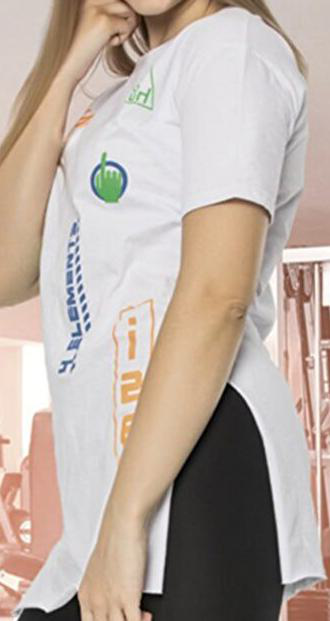

In [35]:
similar_images[0]

In [36]:
def draw(similar_images, image_scores):    
    
    images_per_row = 6

    num_rows = len(similar_images) // images_per_row + (len(similar_images) % images_per_row > 0)

    fig, axes = plt.subplots(num_rows, images_per_row, figsize=(20, 4 * num_rows))
    fig.subplots_adjust(hspace=0.3, wspace=0.3)

    for i, img in enumerate(similar_images):
        row = i // images_per_row
        col = i % images_per_row
        ax = axes[row, col]

        ax.imshow(img)
        ax.set_title(f'Score: {image_scores[i]:.4f}')

        max_x = img.size[0]
        x_ticks = [x for x in range(0, max_x, 50) if x < max_x]
        ax.set_xticks(x_ticks)
        ax.set_xticklabels([str(x) for x in x_ticks])

        max_y = img.size[1]
        y_ticks = [y for y in range(0, max_y, 20) if y < max_y]
        ax.set_yticks(y_ticks)
        ax.set_yticklabels([str(y) for y in y_ticks])

        #ax.tick_params(left=True, bottom=False)

    for j in range(i + 1, images_per_row * num_rows):
        row = j // images_per_row
        col = j % images_per_row
        axes[row, col].axis('off')
        
    plt.suptitle('Output', size=16)
    plt.show()

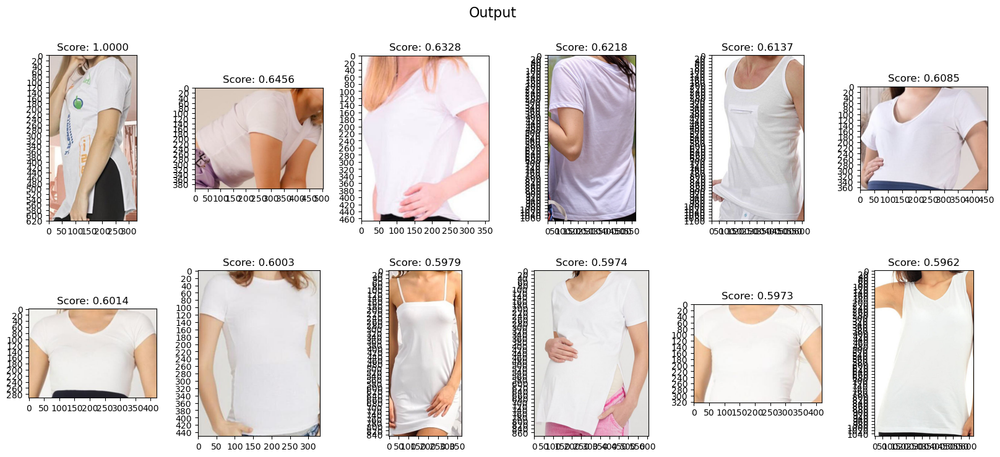

In [37]:
draw(similar_images, image_scores)

In [38]:
# Selected the indices same as ResNet to compare the results
indices = [34878, 12622, 30894, 14983, 26144, 22978,  3281, 34132, 10456, 11077]

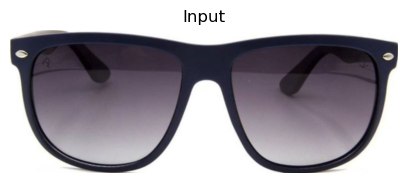

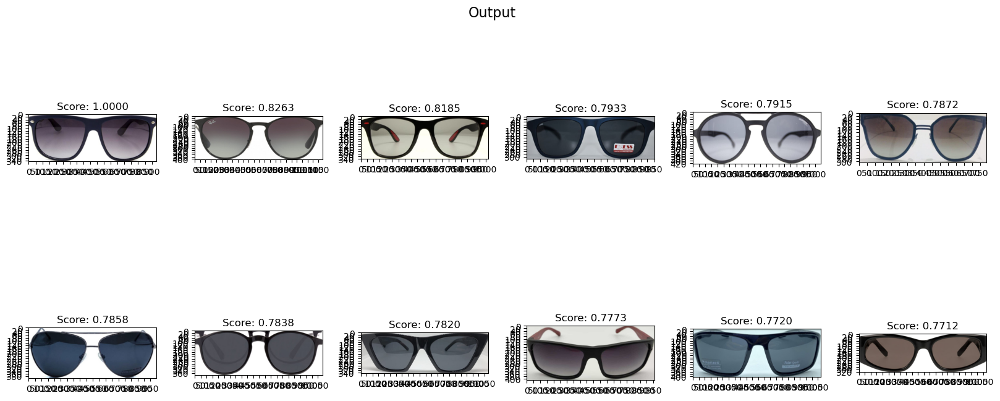

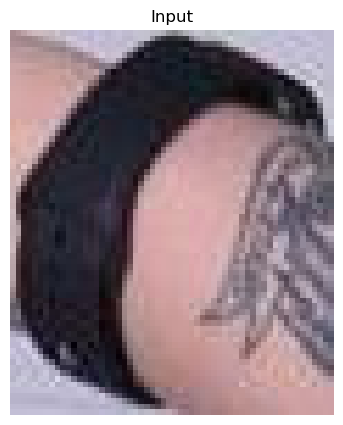

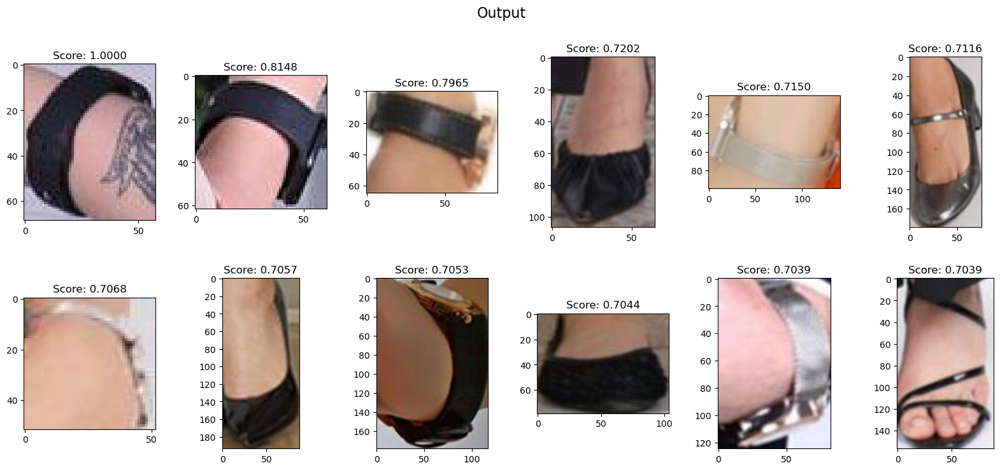

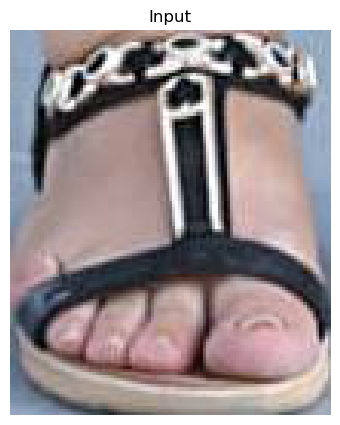

...

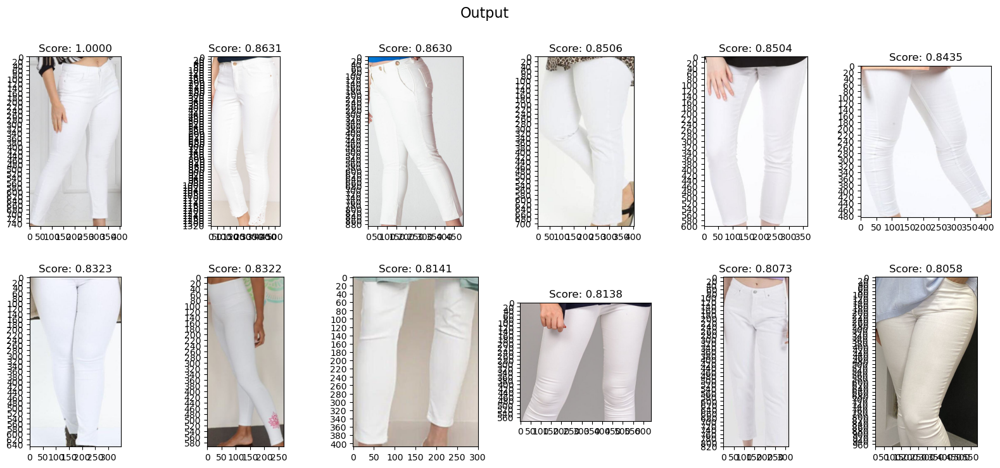

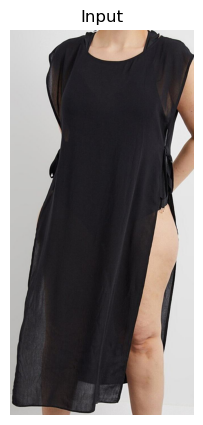

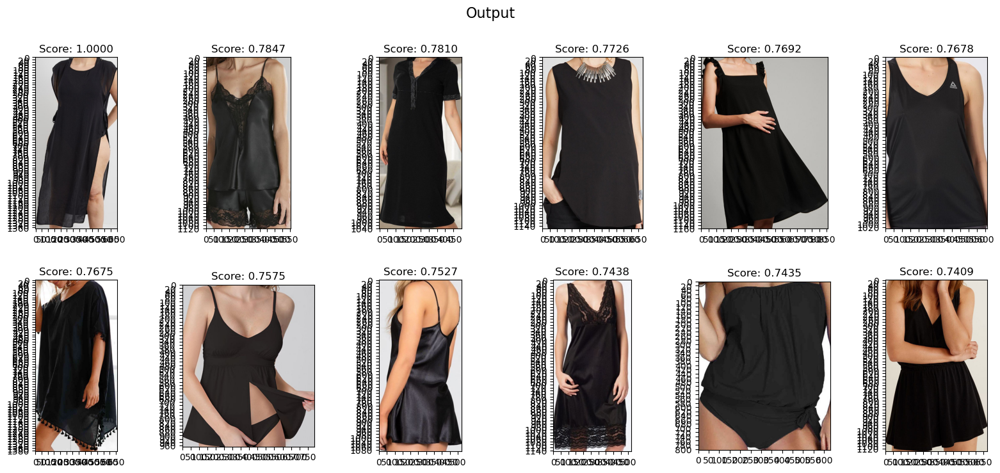

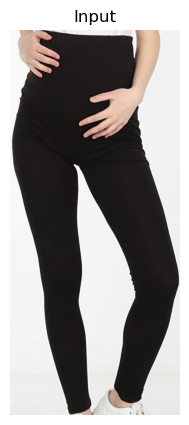

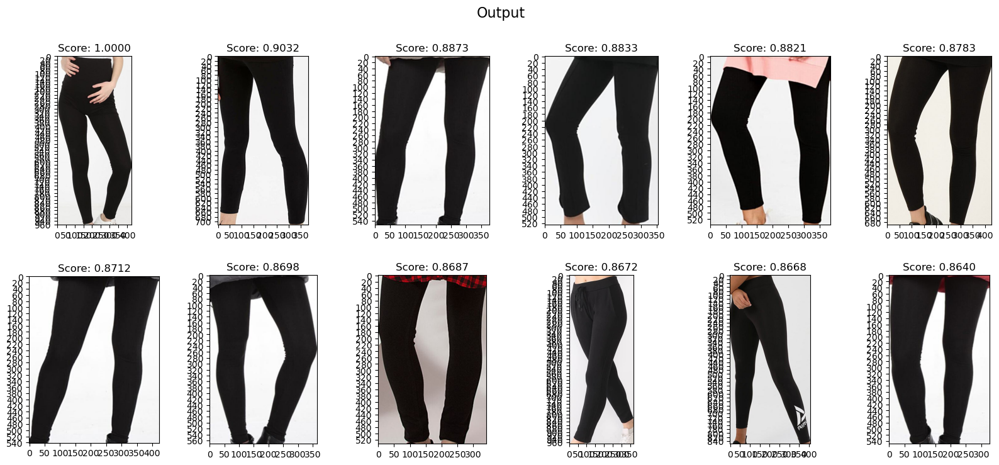

In [40]:
for index in indices:
    input_image = load_images_by_indices([index], cropped_images_dir)[0]
    similar_indices, image_scores = find_similar_images(features[index], features)
    similar_images = load_images_by_indices(similar_indices, cropped_images_dir)
    
    plt.figure(figsize=(5, 5))
    plt.imshow(input_image)
    plt.title("Input")
    plt.axis('off')
    plt.show()
    
    draw(similar_images, image_scores)